In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ln -s /content/drive/MyDrive/src/XAI-CV-CounterfactualSamples
%cd XAI-CV-CounterfactualSamples

/content/drive/MyDrive/src/XAI-CV-CounterfactualSamples


In [ ]:
%cd exp_ham10k

/content/drive/MyDrive/src/XAI-CV-CounterfactualSamples/exp_ham10k


# Initialization

In [ ]:
# import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
import glob
import os
from sklearn.cluster import KMeans

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
import configs

In [ ]:
files = glob.glob('outputs/features/*-feature-classifier256/*/*.npy')
files.sort()
print(len(files))

10015


# Clustering

In [ ]:
feat = np.load(files[0])
print(feat.shape)

(8, 8, 2048)


In [ ]:
feat.nbytes

524288

In [ ]:
class FeatureClustering():
  def __init__(self, in_dir,
               save_dir=None,
               k_range=range(2, 33, 2),
               disease=None):
    self.in_dir = in_dir
    self.save_dir = save_dir
    self.k_range = k_range
    self.files = None
    self.features = None
    self.besk_k = 0
    self.disease = disease

  def load_features(self):
    files = glob.glob(self.in_dir+f'/{self.disease}/*.npy')
    print(self.in_dir)
    print(len(files), 'found')
    files.sort()
    self.files = files
    self.features = [np.load(it).reshape(-1) for it in files]
    return self.features

  def compute_avg_distance(self, features,
                                 centroids,
                                 predictions):
    nfeats = np.array(features)
    ncents = np.array([centroids[it] for it in predictions])
    return np.mean((nfeats - ncents)**2)

  def cluster(self, k):
    model = KMeans(n_clusters=k, init='random')
    model.fit(self.features)
    centroids = model.cluster_centers_
    predictions = model.labels_
    avg_distance = self.compute_avg_distance(self.features,
                                        centroids,
                                        predictions)
    print(k, avg_distance)
    return k, avg_distance, centroids

  def run(self):
    self.load_features()
    ks, avg_distances, centroids = [], [], []
    for i_k in self.k_range:
      k, avg_dist, cents = self.cluster(i_k)
      ks.append(k)
      avg_distances.append(avg_dist)
      centroids.append(cents)

    self.plot(ks, avg_distances)
    index = avg_distances.index(min(avg_distances))
    best_k = ks[index]
    print('best_k:', k, min(avg_distances))
    self.best_k = best_k
    self.save()
    return best_k, min(avg_distances)

  def plot(self, ks, distances):
    plt.plot(ks, distances)
    plt.show()

  def save(self):
    k, avg_dist, centroids = self.cluster(self.best_k)
    if not os.path.exists(self.save_dir):
      os.makedirs(self.save_dir)
    filename = self.save_dir+'/centroids_%s_%d.npy'%(self.disease, k)
    np.save(filename, centroids)
    print(filename, 'saved')

outputs/features/train-feature-classifier256/
163 found
2 1.6506196294550375
4 1.4437081993853313
6 1.3672101877179175
8 1.3067328287024618
10 1.2556301263334457
12 1.2273483026820942
14 1.1776783752931412
16 1.1534450492989567
18 1.1330154934589123
20 1.0981267403347994
22 1.067181754650708
24 1.0314589714566935
26 1.0390213367275825
28 0.9988423742244731
30 0.9692146806305738
32 0.9551132646031679


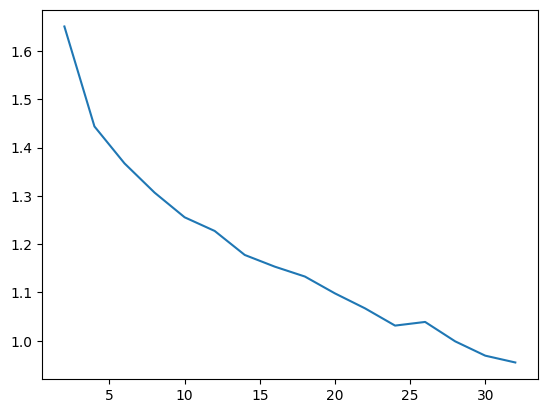

best_k: 32 0.9551132646031679
32 0.938602207996881
outputs/centroids-feature-classifier256//centroids_akiec_32.npy saved
outputs/features/train-feature-classifier256/
257 found
2 1.7126632444397556
4 1.504898117667095
6 1.3815470515804222
8 1.317914181466534
10 1.2622688254598746
12 1.2329935631562834
14 1.1850938359508656
16 1.168662565314899
18 1.1409277885855245
20 1.1198619812573425
22 1.097495264177337
24 1.0650622027161012
26 1.0599533004175563
28 1.0353169981026615
30 1.0095307613218958
32 1.0089211404532763


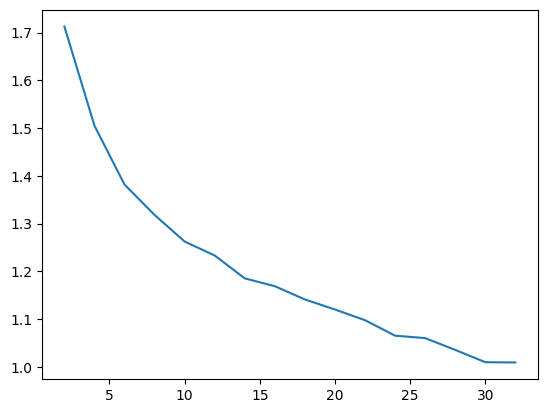

best_k: 32 1.0089211404532763
32 0.9976666794469895
outputs/centroids-feature-classifier256//centroids_bcc_32.npy saved
outputs/features/train-feature-classifier256/
549 found
2 1.4937104439554396
4 1.3505590687653515
6 1.29032488666375
8 1.2518817041692754
10 1.2338335232672841
12 1.2089985487369603
14 1.1893470422765593
16 1.1726738287391267
18 1.1641908960468037
20 1.1469573865842955
22 1.1406363999462825
24 1.129205390375019
26 1.117838641338041
28 1.1046954590843163
30 1.106034477102211
32 1.0901332934663948


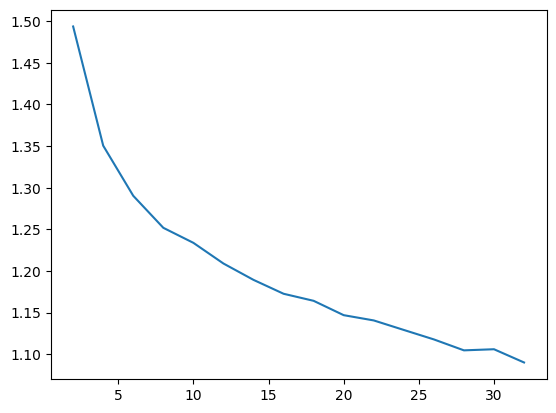

best_k: 32 1.0901332934663948
32 1.0876100102975184
outputs/centroids-feature-classifier256//centroids_bkl_32.npy saved
outputs/features/train-feature-classifier256/
57 found
2 2.5060692334728074
4 1.9190358718865828
6 1.705248006685777
8 1.5036698411440244
10 1.40503358177061
12 1.2844004915899576
14 1.1833063524237384
16 1.0853234054805716
18 1.021723896395645
20 0.9141766306364211
22 0.8907201261198429
24 0.7914921013141781
26 0.7479718341857718
28 0.7029416182561113
30 0.6008127138187895
32 0.5796450036524541


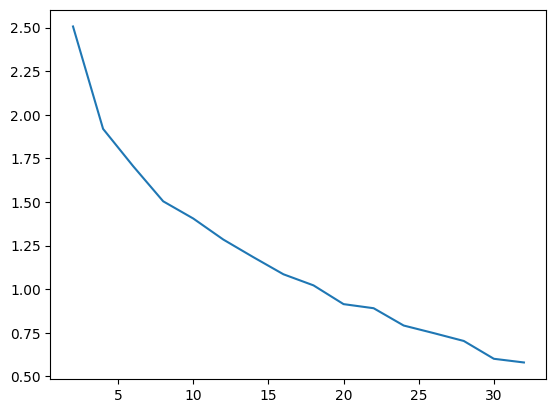

best_k: 32 0.5796450036524541
32 0.4907691260292292
outputs/centroids-feature-classifier256//centroids_df_32.npy saved
outputs/features/train-feature-classifier256/
556 found
2 1.666847677098787
4 1.541213224108826
6 1.4694508375299822
8 1.42585599452798
10 1.386437414481936
12 1.3593670825808883
14 1.3420918595085758
16 1.3217137651440702
18 1.3068655336309374
20 1.2809281522220415
22 1.2676386347789863
24 1.2574674689285208
26 1.2513679728706932
28 1.2352437720078
30 1.2265741844801883
32 1.2123984981589784


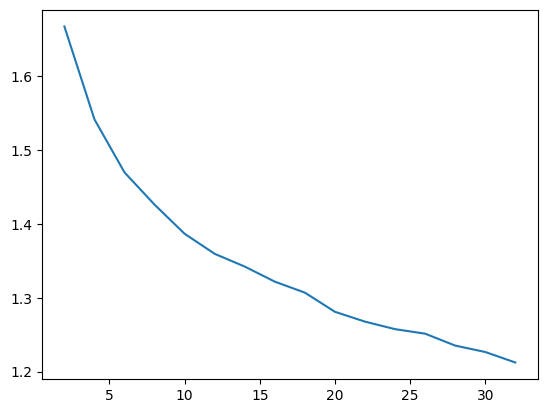

best_k: 32 1.2123984981589784
32 1.2131169585110229
outputs/centroids-feature-classifier256//centroids_mel_32.npy saved
outputs/features/train-feature-classifier256/
3352 found


In [ ]:
# for disease in ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']:
for disease in ['nv', 'vasc']:
  featClustering = FeatureClustering(
            in_dir='outputs/features/train-feature-classifier256/',
            save_dir='outputs/centroids-feature-classifier256/',
            disease=disease)
  featClustering.run()

outputs/features/train-feature-classifier256/
3352 found
2 1.8753530731528587
4 1.715740278286658
6 1.6508480023623247
8 1.5986269222622216
10 1.5501607598862308
12 1.519396618560429
14 1.491437221728552
16 1.4715641395006411
18 1.4552036251527622
20 1.4407574098058564
22 1.425324309133317
24 1.4128677939995349
26 1.4027326508602287
28 1.393582601961061
30 1.3856346050336281
32 1.3762781935748019


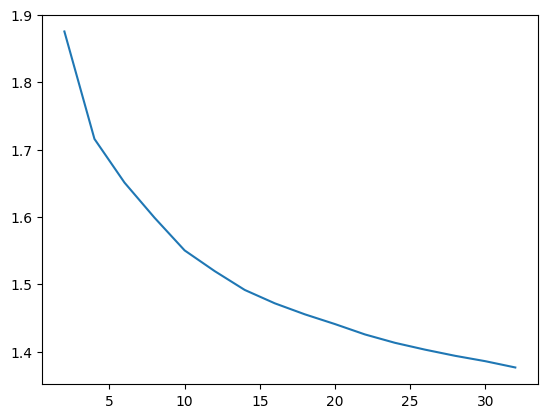

best_k: 32 1.3762781935748019
32 1.3757483392853598
outputs/centroids-feature-classifier256//centroids_nv_32.npy saved
outputs/features/train-feature-classifier256/
71 found
2 1.886126817118611
4 1.5787546346377272
6 1.435257993957847
8 1.336509673368283
10 1.2671418924906064
12 1.1599374302736045
14 1.081835327652607
16 1.0285371639766905
18 0.9591519479516559
20 0.8939817650734818
22 0.8713114383650297
24 0.8181914382803082
26 0.7459366455033989
28 0.677673233295376
30 0.6470007701046707
32 0.6180892441499005


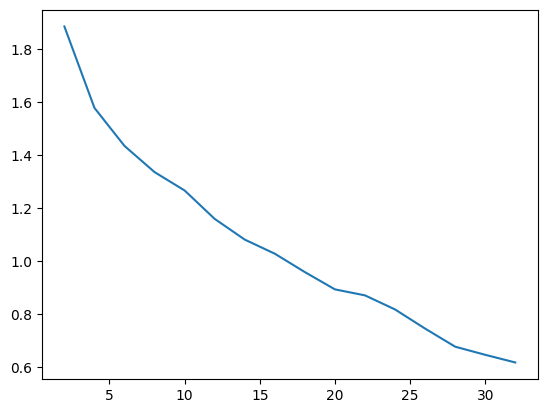

best_k: 32 0.6180892441499005
32 0.6282009457386813
outputs/centroids-feature-classifier256//centroids_vasc_32.npy saved


In [ ]:
# for disease in ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']:
for disease in ['nv', 'vasc']:
  featClustering = FeatureClustering(
            in_dir='outputs/features/train-feature-classifier256/',
            save_dir='outputs/centroids-feature-classifier256/',
            disease=disease)
  featClustering.run()

# Centroid Visualization

In [ ]:
class CentroidVisualizer():
  def __init__(self, in_file):
    self.in_file = in_file
    self.centroids = np.load(self.in_file)

  def map2img(self, amap):
    img = amap.astype(np.uint8)
    return cv2.resize(img, configs.IMAGE_SIZE[:2])

  def plot(self):
    maps = np.reshape(self.centroids, [-1, 8, 8, 2048])
    maps = [np.mean(it, axis=2) for it in maps]
    maps = [(it-np.min(it))/(np.max(it)-np.min(it))*255 for it in maps]
    imgs = [self.map2img(it) for it in maps]

    for i in range(8):
      for j in range(4):
        plt.subplot(4, 8, i*4+j+1)
        plt.imshow(imgs[i*4+j])
        plt.axis('off')

    plt.tight_layout()
    plt.show()

akiec


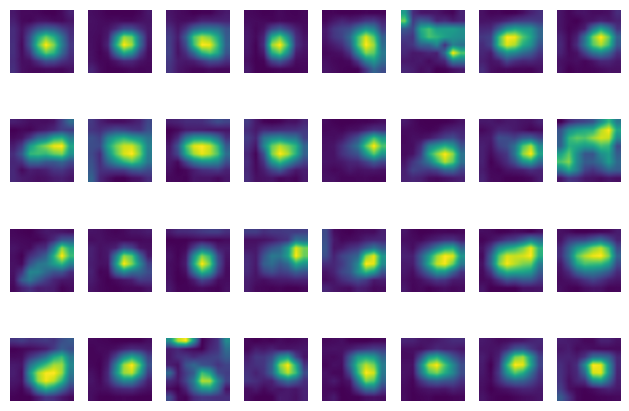

bcc


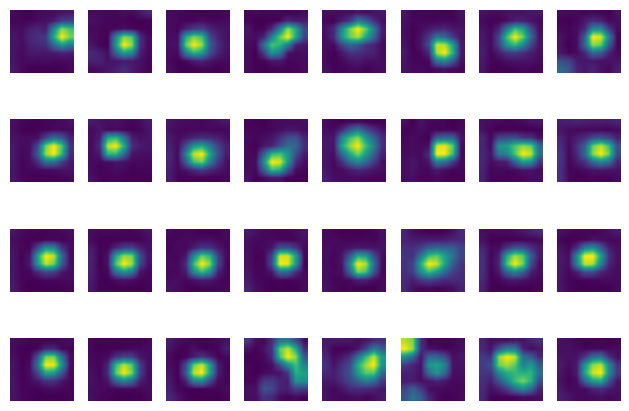

bkl


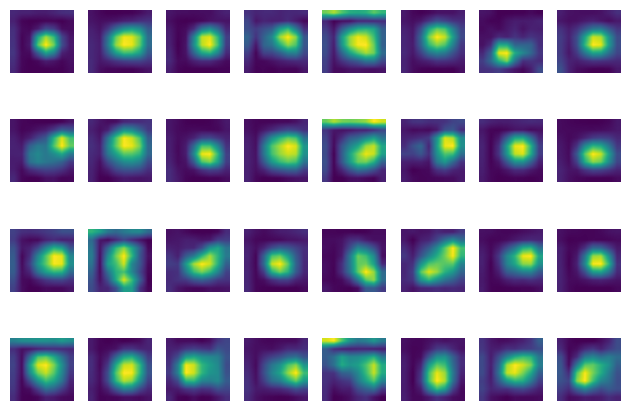

df


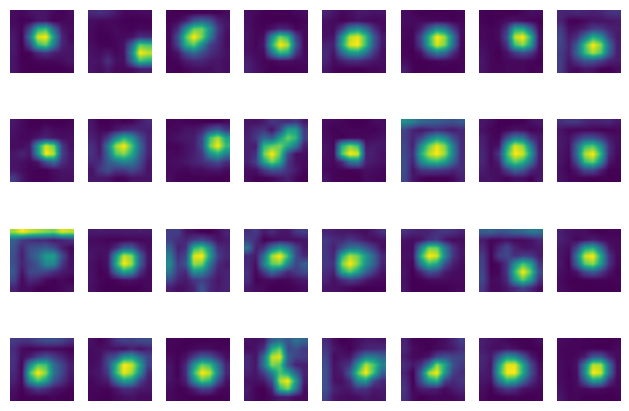

mel


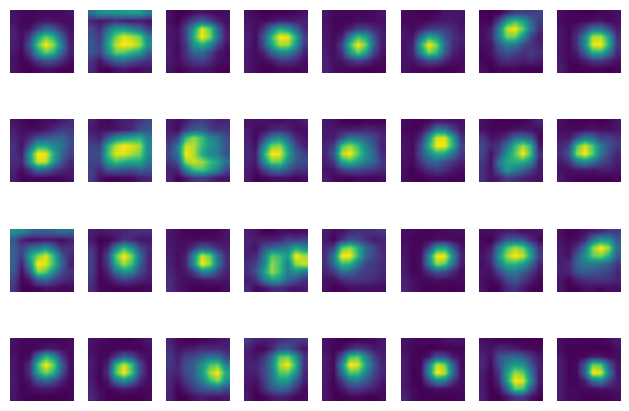

nv


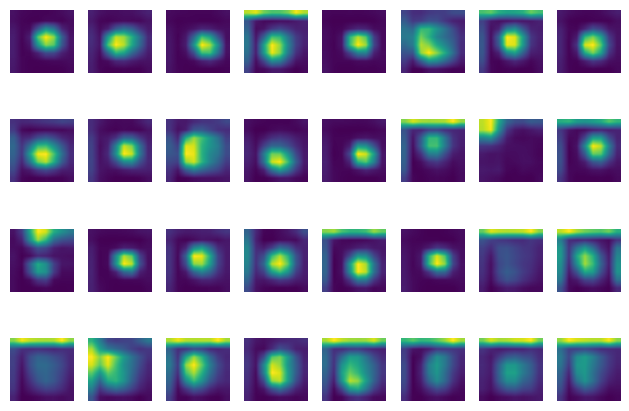

vasc


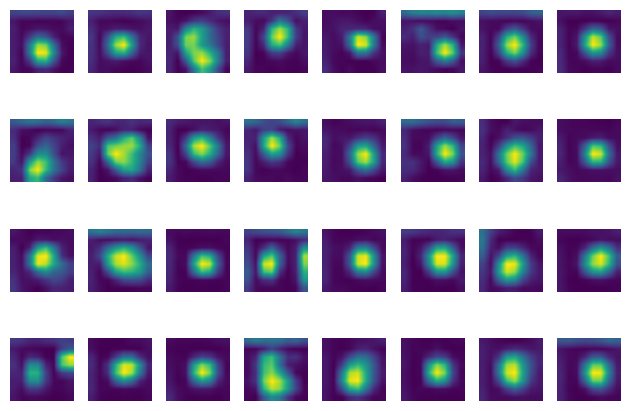

In [ ]:
for disease in configs.CLASS_NAMES:
  print(disease)
  centViz = CentroidVisualizer(f'outputs/centroids-feature-classifier256/centroids_{disease}_32.npy')
  centViz.plot()

# Sample Visualization

In [ ]:
class SampleVisualization():
  def __init__(self, centroids_filename,
                     sample_dir,
                     feature_dir):
    self.centroids_filename = centroids_filename
    self.sample_dir = sample_dir
    self.feature_dir = feature_dir
    self.load()

  def load(self):
    self.centroids = np.load(self.centroids_filename)
    print('centroid shape:', self.centroids.shape)
    img_files = glob.glob(self.sample_dir+'/*.jpg')
    img_files.sort()
    print(len(img_files), 'images found')
    # /content/drive/MyDrive/datasets/HAM10000/train/akiec
    feature_files = [self.feature_dir+'/' +
                     os.path.basename(it).replace('.jpg', '.feat.npy')
                        for it in img_files]
    self.df_filenames = pd.DataFrame(
        {'img':img_files,
         'feature':feature_files}
    )

  def compute_distances(self, filenames):
    distances = []
    for feat_filename in filenames:
      feature = np.load(feat_filename).reshape(-1)
      dist = ((self.centroids - feature)**2).sum(axis=1)**.5
      distances.append(dist)
    return np.array(distances), np.argmin(distances, axis=1)

  def load_img_rbg(self, filename):
    img = plt.imread(filename)
    H, W, _ = configs.IMAGE_SIZE
    delta = (W-H)//2
    img = img[:, delta:delta+H, :]
    return cv2.resize(img, configs.IMAGE_SIZE[:2])

  def plot(self, num=4):
    samples = self.df_filenames.sample(n=num)
    distances, centroid_ids = self.compute_distances(samples['feature'])
    for i in range(num):
      plt.subplot(2, 1, 1)
      plt.bar(range(distances[i].shape[0]), distances[i])

      plt.subplot(2, 2, 3)
      plt.imshow(self.load_img_rbg(samples.iloc[i, 0]))
      plt.axis('off')

      plt.subplot(2, 2, 4)
      cent = self.centroids[centroid_ids[i]].reshape([8, 8, 2048])
      cent = np.sum(cent, axis=2)
      cent = cv2.resize(cent, configs.IMAGE_SIZE[:2])
      cent = (cent / np.max(cent) * 255.).astype(np.uint8)
      plt.imshow(cent)
      plt.axis('off')

      plt.tight_layout()
      plt.show()

## Akiec

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_akiec_32.npy',
    configs.DATA_DIR+'/train/akiec',
    'outputs/features/train-feature-classifier256/akiec'
)
sampleViz.plot(16)

Output hidden; open in https://colab.research.google.com to view.

## BCC

centroid shape: (32, 131072)
257 images found


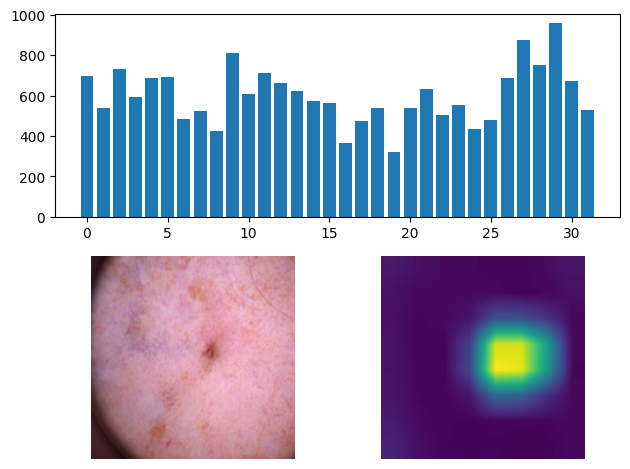

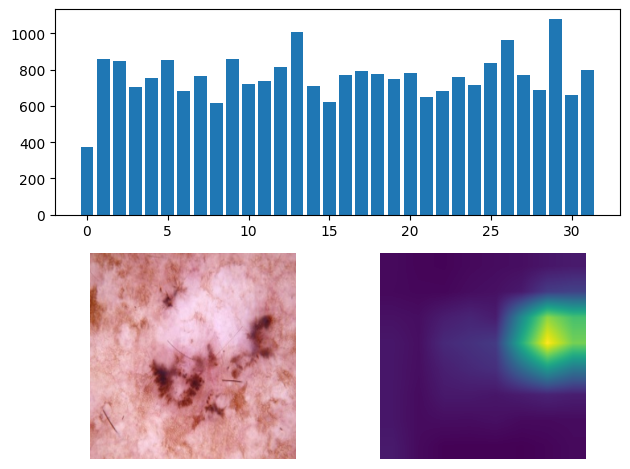

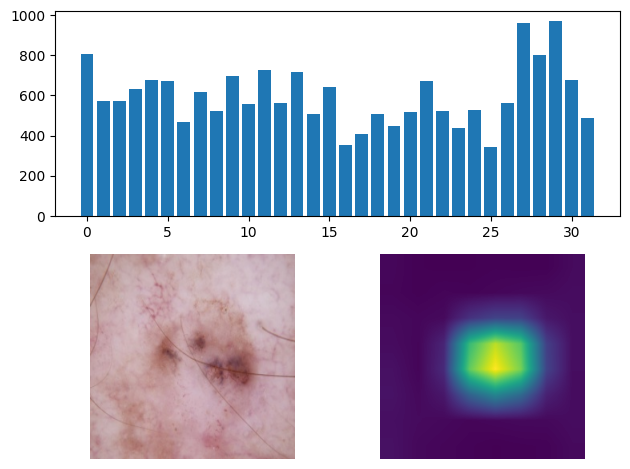

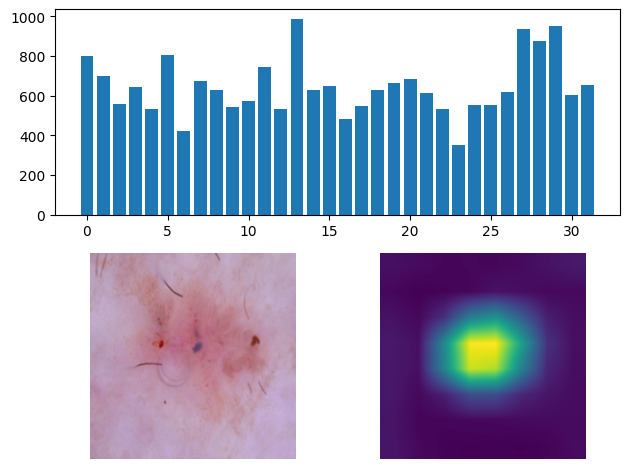

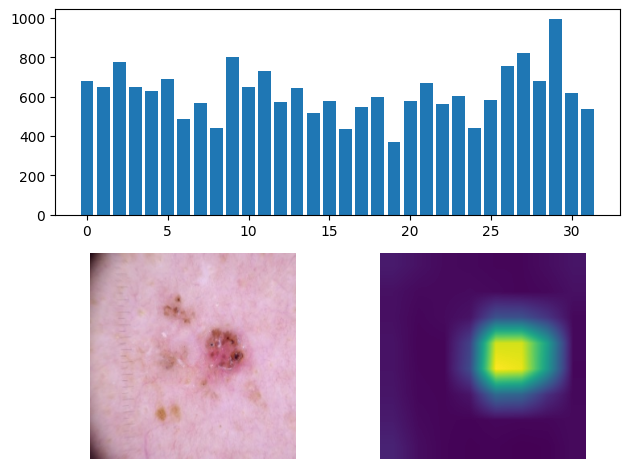

...

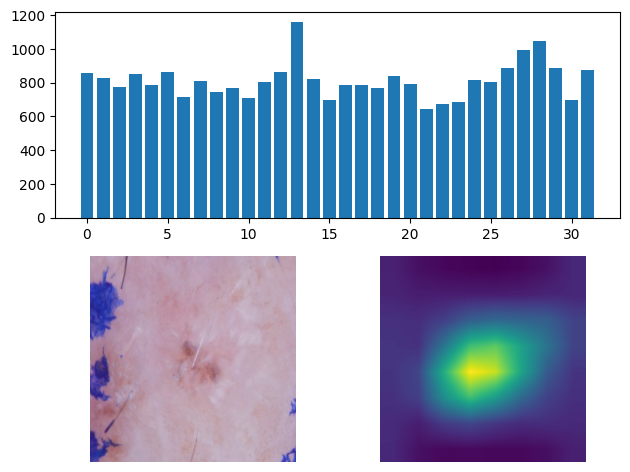

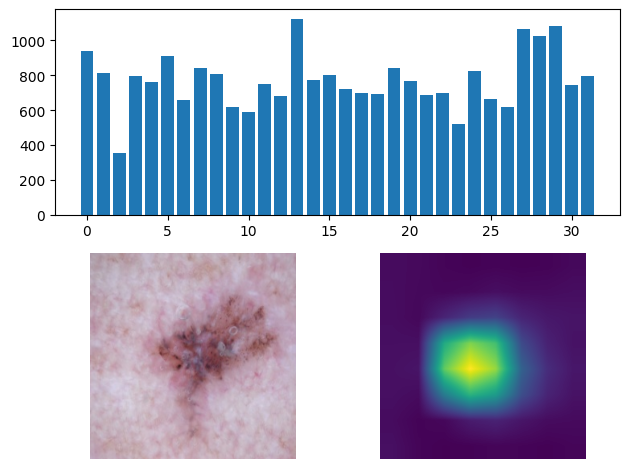

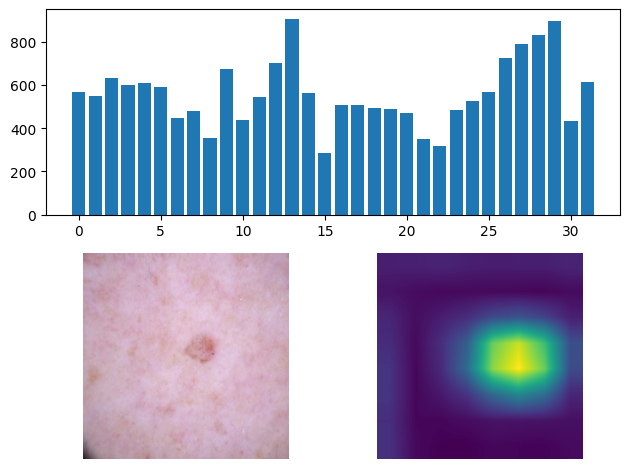

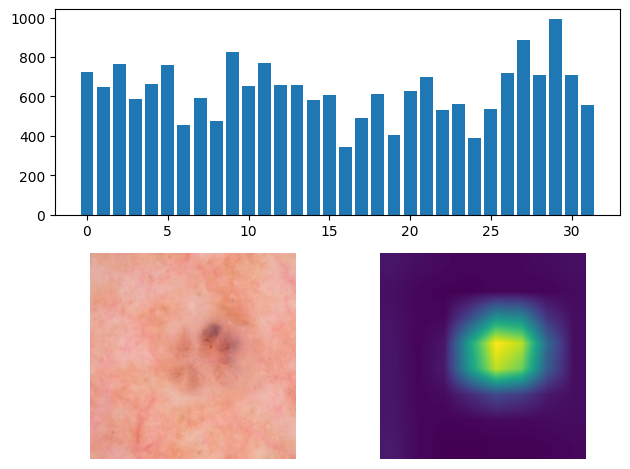

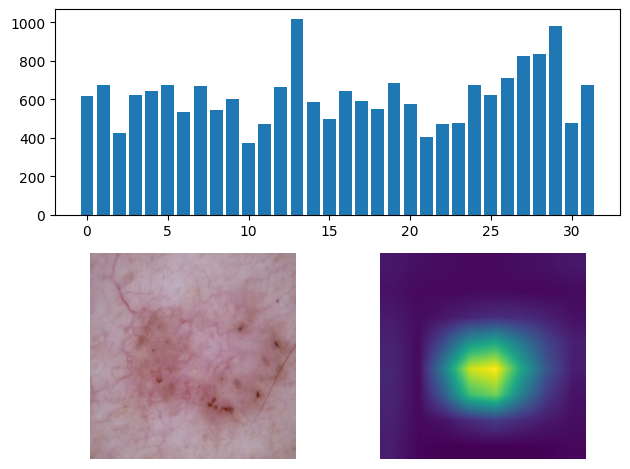

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_bcc_32.npy',
    configs.DATA_DIR+'/train/bcc',
    'outputs/features/train-feature-classifier256/bcc'
)
sampleViz.plot(16)

## BKL

centroid shape: (32, 131072)
549 images found


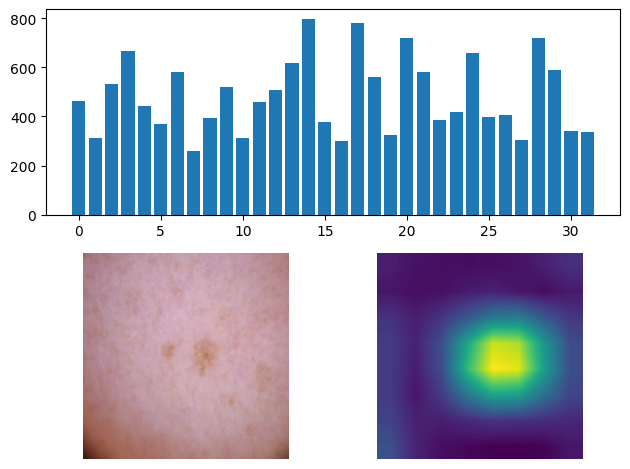

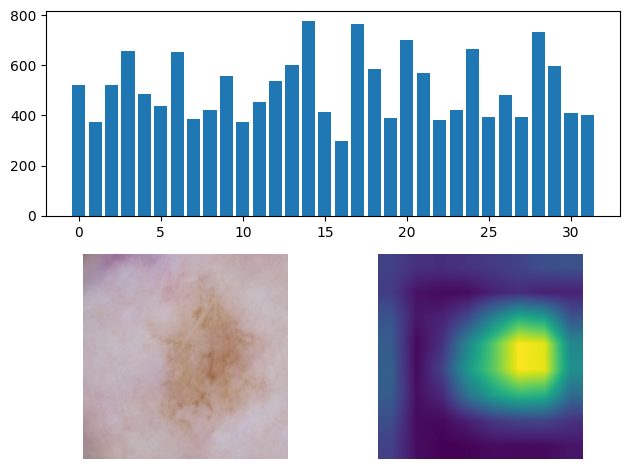

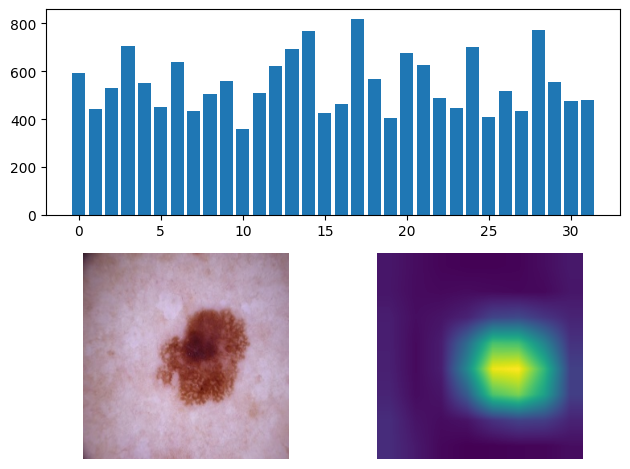

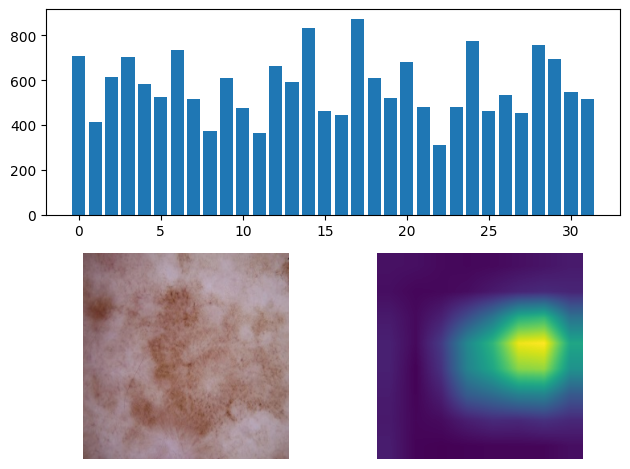

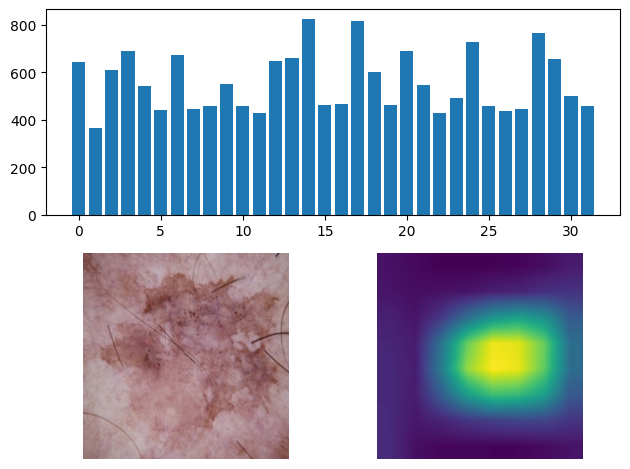

...

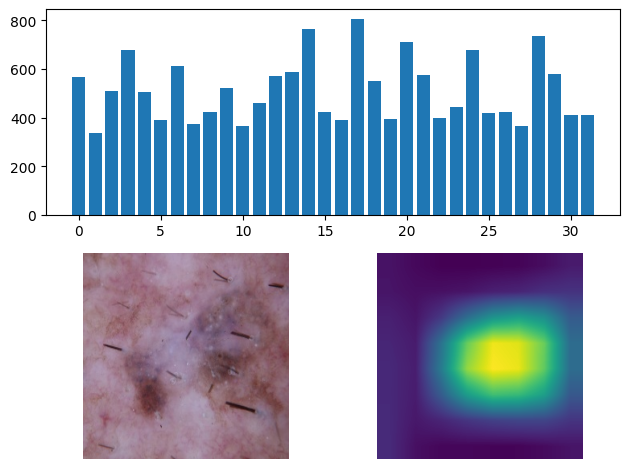

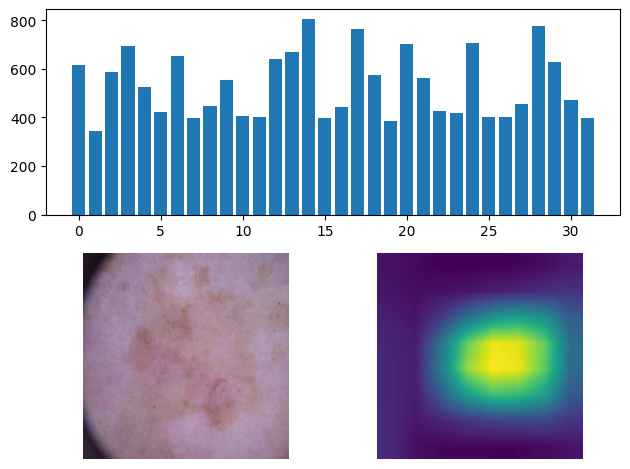

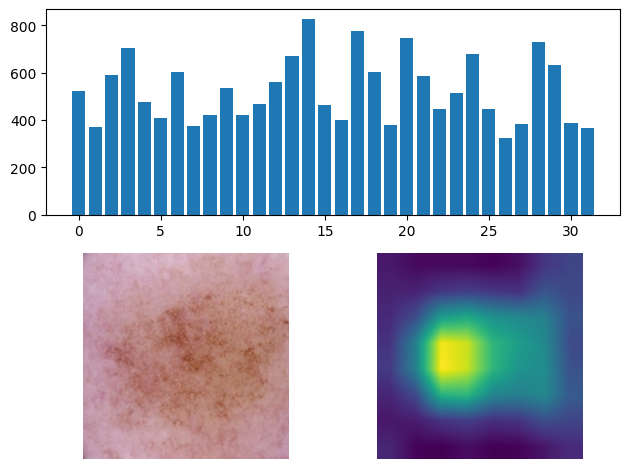

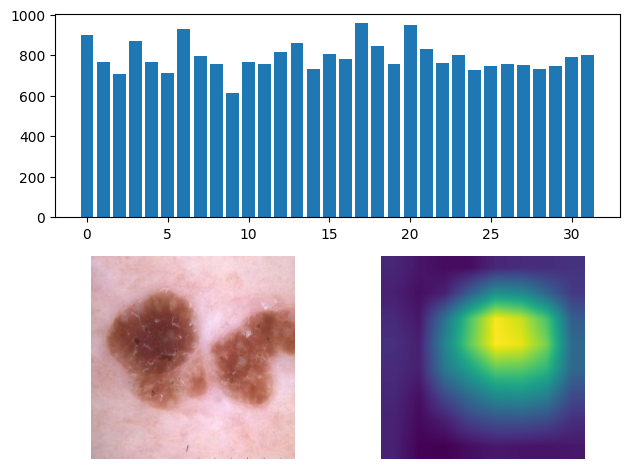

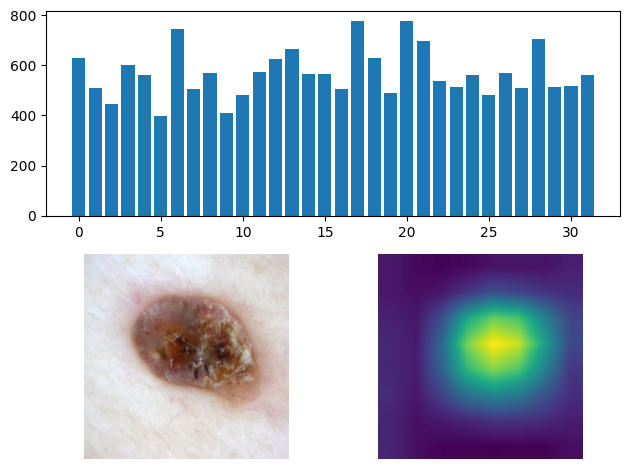

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_bkl_32.npy',
    configs.DATA_DIR+'/train/bkl',
    'outputs/features/train-feature-classifier256/bkl'
)
sampleViz.plot(16)

## DF

centroid shape: (32, 131072)
57 images found


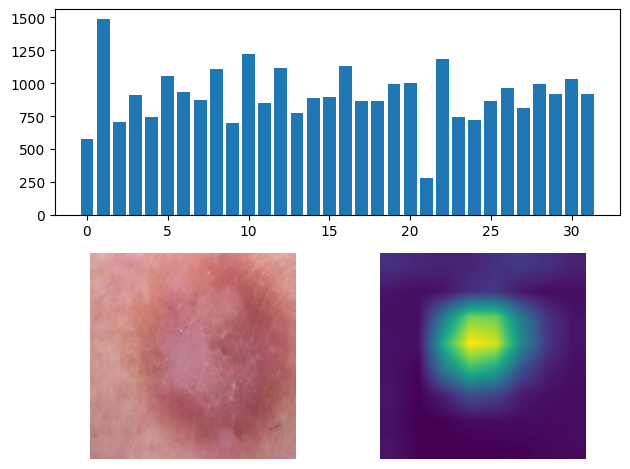

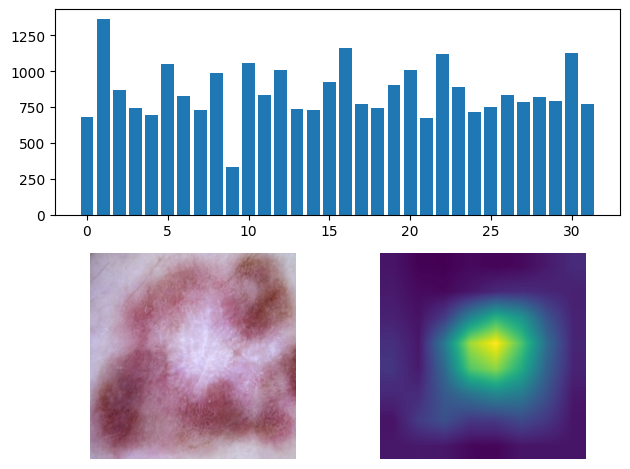

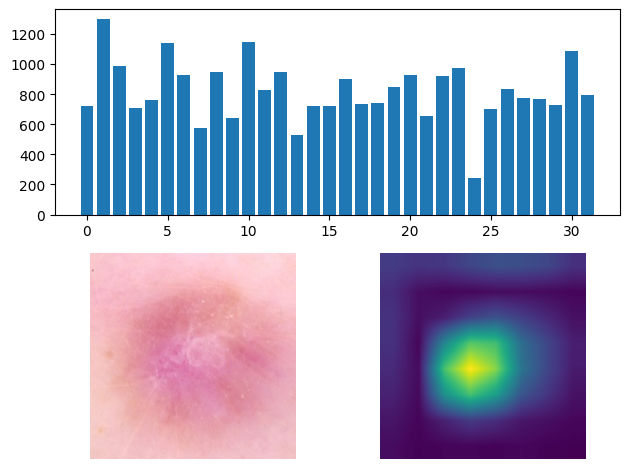

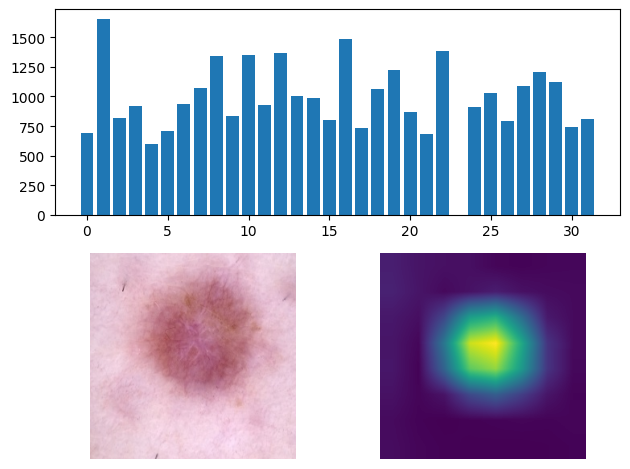

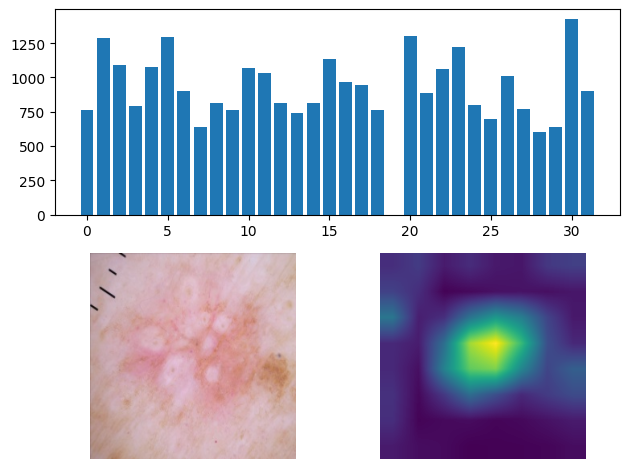

...

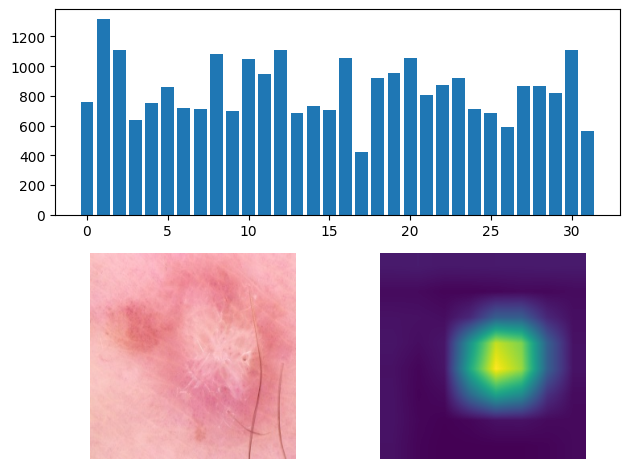

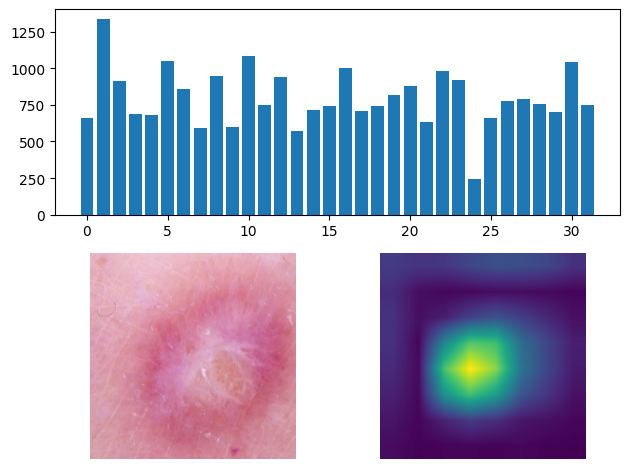

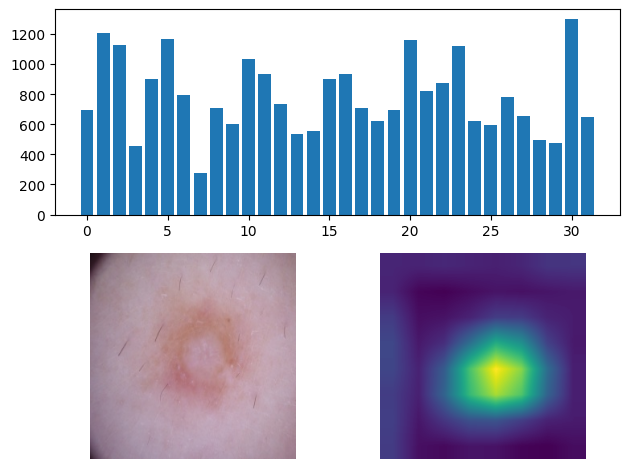

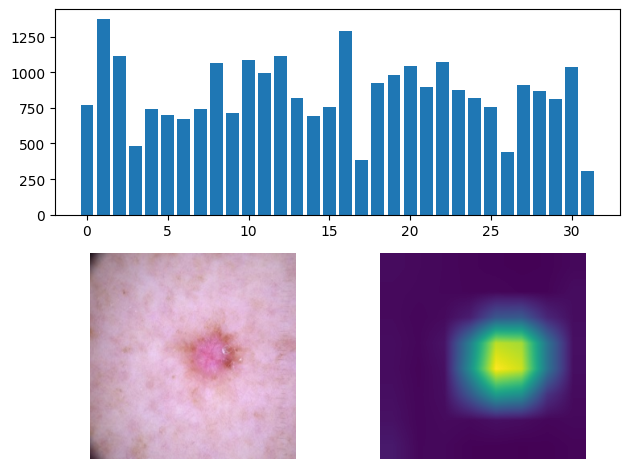

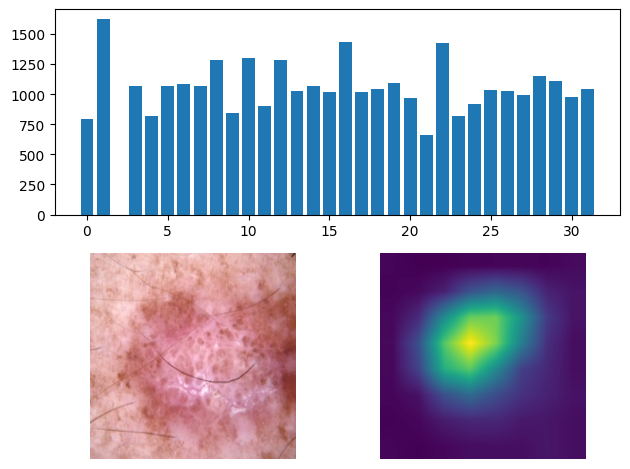

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_df_32.npy',
    configs.DATA_DIR+'/train/df',
    'outputs/features/train-feature-classifier256/df'
)
sampleViz.plot(16)

## MEL

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_mel_32.npy',
    configs.DATA_DIR+'/train/mel',
    'outputs/features/train-feature-classifier256/mel'
)
sampleViz.plot(16)

Output hidden; open in https://colab.research.google.com to view.

## NV

centroid shape: (32, 131072)
3352 images found


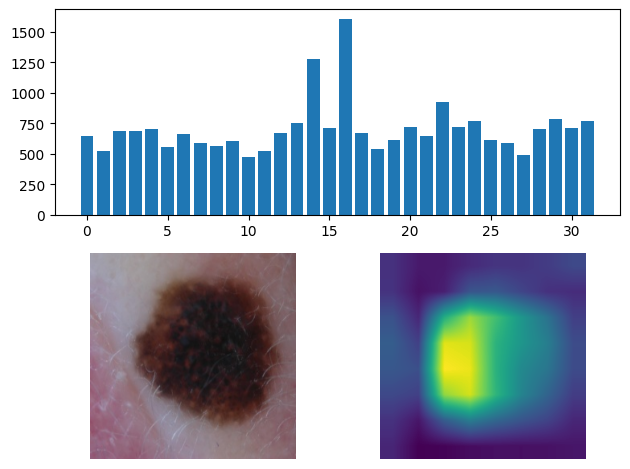

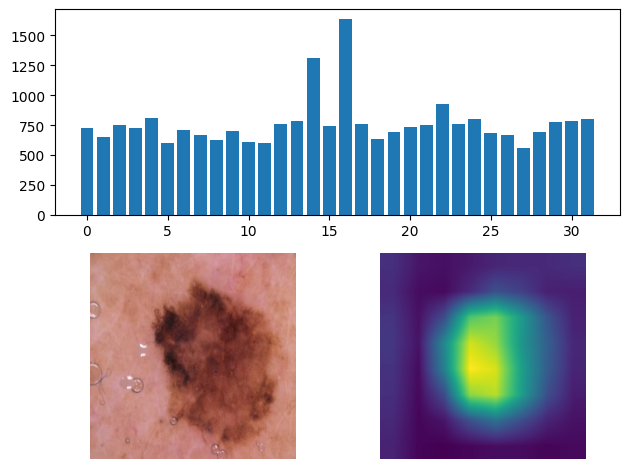

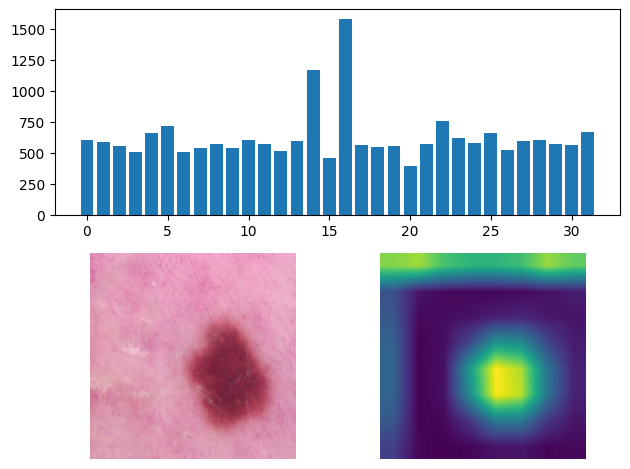

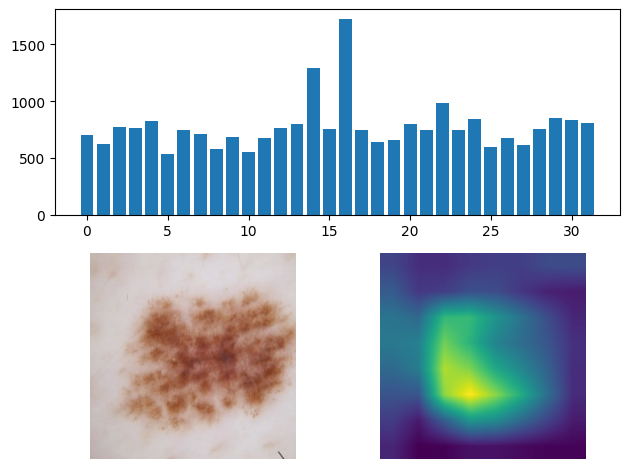

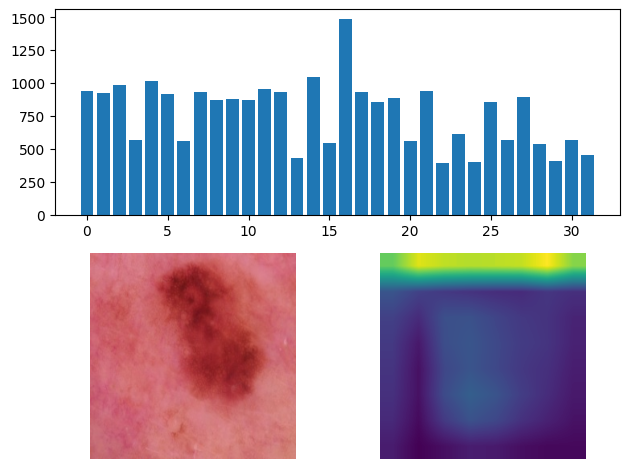

...

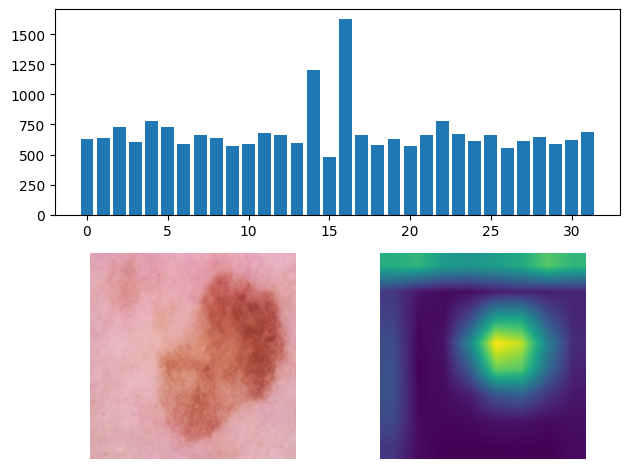

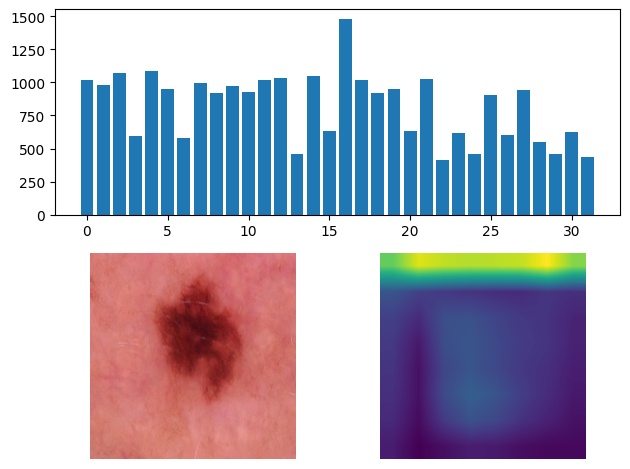

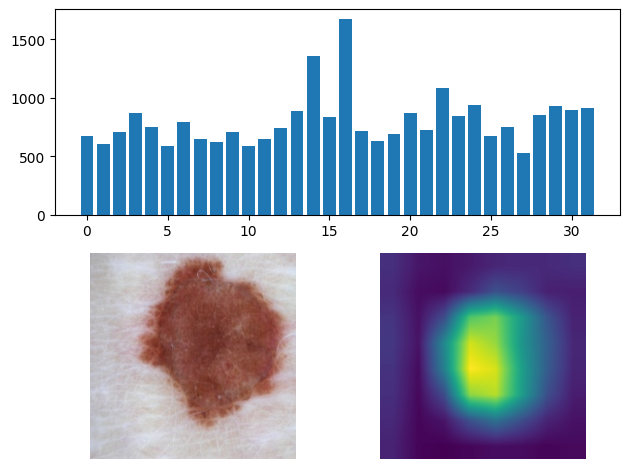

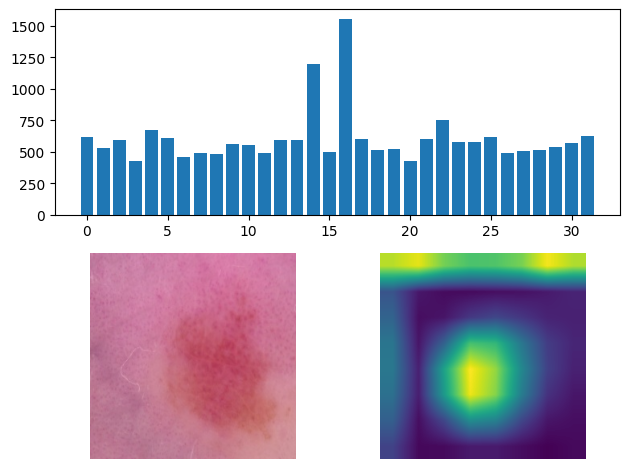

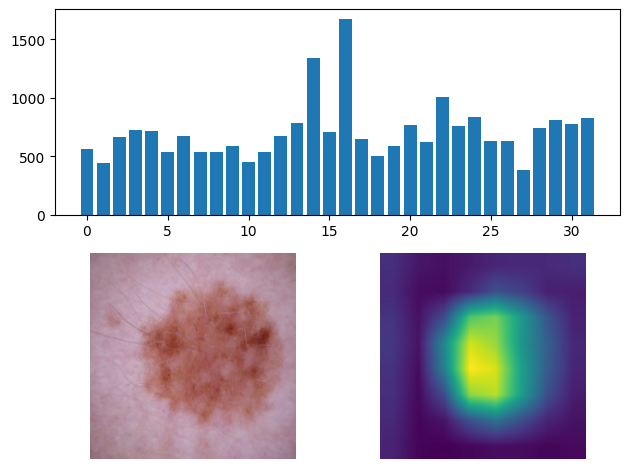

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_nv_32.npy',
    configs.DATA_DIR+'/train/nv',
    'outputs/features/train-feature-classifier256/nv'
)
sampleViz.plot(16)

## VASC

centroid shape: (32, 131072)
71 images found


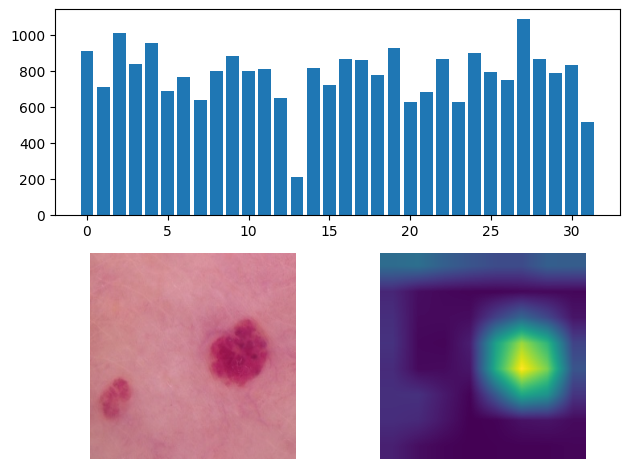

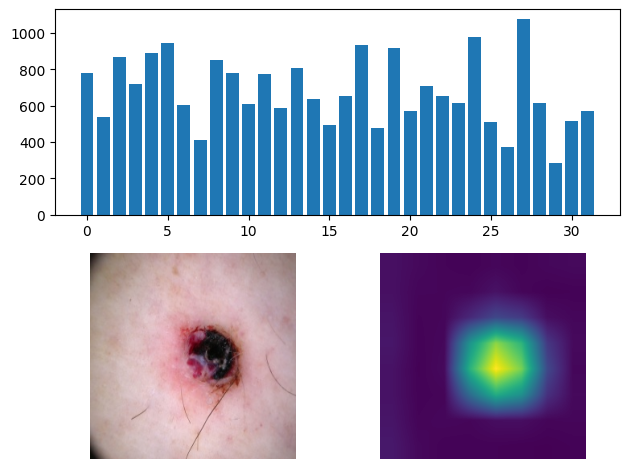

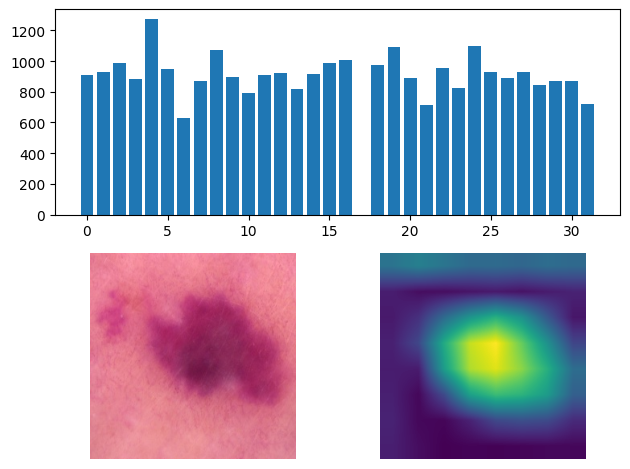

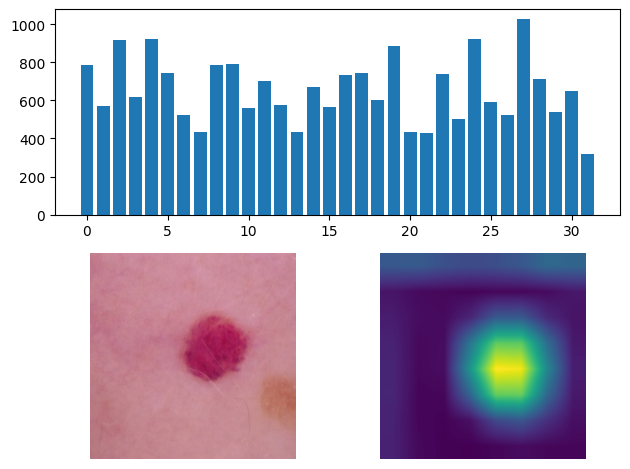

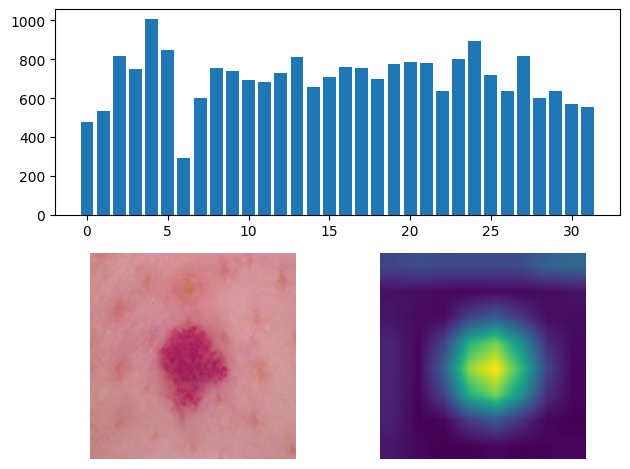

...

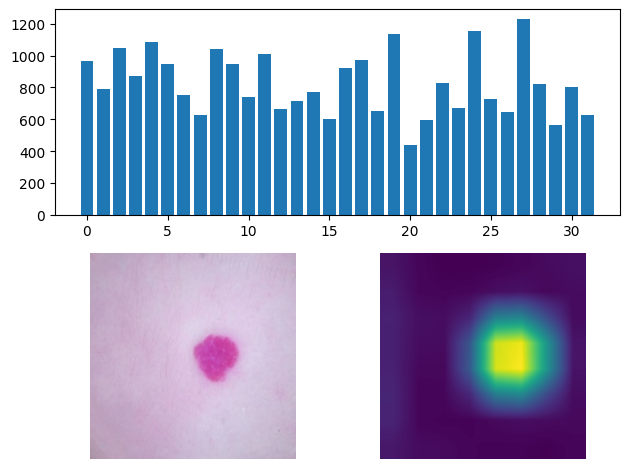

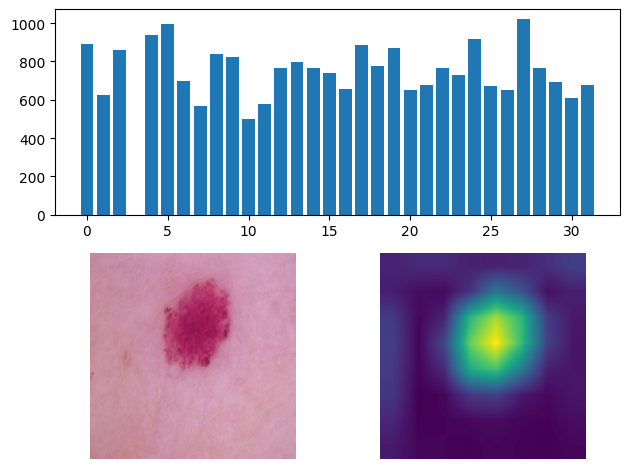

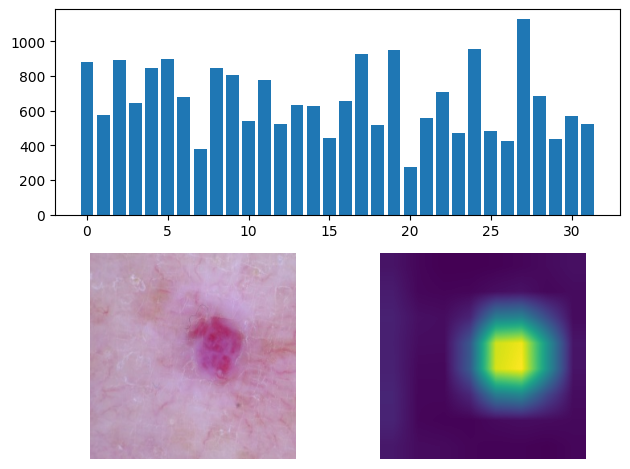

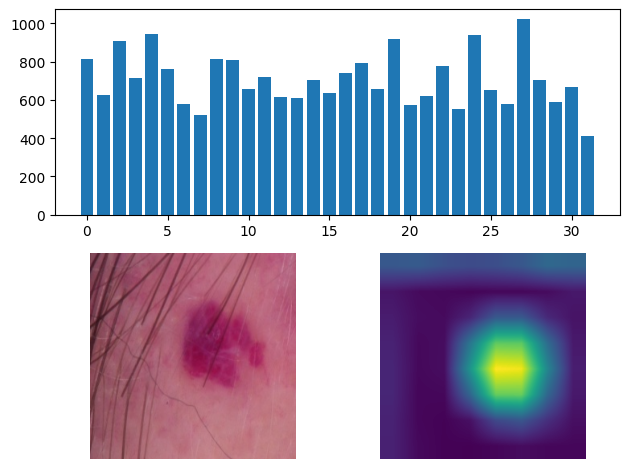

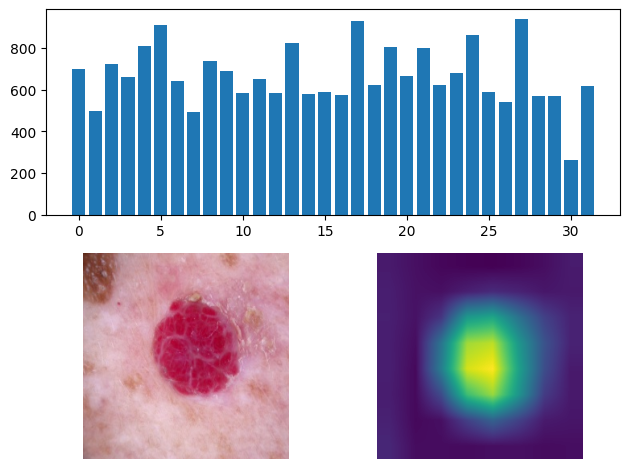

In [ ]:
sampleViz = SampleVisualization(
    'outputs/centroids-feature-classifier256/centroids_vasc_32.npy',
    configs.DATA_DIR+'/train/vasc',
    'outputs/features/train-feature-classifier256/vasc'
)
sampleViz.plot(16)

# Mapping features-concepts

In [ ]:
feature_files = glob.glob('outputs/features/*-feature-classifier256/*/*.npy')
feature_files.sort()
print(len(feature_files))
for it in feature_files[:5]:
  print(it)

10015
outputs/features/test-feature-classifier256/akiec/ISIC_0024511.feat.npy
outputs/features/test-feature-classifier256/akiec/ISIC_0024539.feat.npy
outputs/features/test-feature-classifier256/akiec/ISIC_0024575.feat.npy
outputs/features/test-feature-classifier256/akiec/ISIC_0024579.feat.npy
outputs/features/test-feature-classifier256/akiec/ISIC_0024646.feat.npy


In [ ]:
def feature_file_to_image_file(filename):
  items = filename.split('/')[2:]
  items[0] = items[0].replace('-feature-classifier256', '')
  items[-1] = items[-1].replace('.feat.npy', '.jpg')
  return os.path.join(*([configs.DATA_DIR]+items))

img_files = [feature_file_to_image_file(it) for it in feature_files]
for it in img_files[:5]:
  print(it)

../datasets/HAM10000/test/akiec/ISIC_0024511.jpg
../datasets/HAM10000/test/akiec/ISIC_0024539.jpg
../datasets/HAM10000/test/akiec/ISIC_0024575.jpg
../datasets/HAM10000/test/akiec/ISIC_0024579.jpg
../datasets/HAM10000/test/akiec/ISIC_0024646.jpg


In [25]:
def feature_to_concept_id(filename):
  feat = np.load(filename).reshape([-1])
  disease = filename.split('/')[-2]
  centroids_filename = f'outputs/centroids-feature-classifier256/centroids_{disease}_32.npy'
  centroids = np.load(centroids_filename).reshape([-1, 8*8*2048])
  concept_id = ((centroids - feat)**2).sum(axis=1).argmin()
  return concept_id

concept_ids = [feature_to_concept_id(it) for it in feature_files]

In [26]:
df = pd.DataFrame({'image':img_files,
                   'feature':feature_files,
                   'concept_id':concept_ids}
      )
df.to_csv('outputs/concept_ids.csv')